In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Fri Oct 13 21:33:41 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    45W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import os
import pandas as pd

In [ ]:
drive.flush_and_unmount()

In [ ]:
!unzip /content/archive.zip


Archive:  /content/archive.zip
  inflating: Ubuntu-dialogue-corpus/dialogueText.csv  
  inflating: Ubuntu-dialogue-corpus/dialogueText_196.csv  
  inflating: Ubuntu-dialogue-corpus/dialogueText_301.csv  
  inflating: toc.csv                 


In [ ]:
cd /content/Ubuntu-dialogue-corpus

/content/Ubuntu-dialogue-corpus


In [ ]:
# Directory containing the CSV files
dir_name = '/content/Ubuntu-dialogue-corpus'

In [ ]:
# Output CSV file
output_file = '/content/merged.csv'

# Emrge CSV

In [ ]:
# Initialize an empty list to store DataFrames
dfs = []

# Verify the directory
print(f"Checking directory: {dir_name}")
print("Directory contents:", os.listdir(dir_name))

# Loop through all files in the directory
for item in os.listdir(dir_name):
    # Check if the item is a CSV file
    if item.endswith('.csv'):
        file_path = os.path.join(dir_name, item)
        print(f"Reading {file_path}")
        # Read CSV file into a DataFrame
        df = pd.read_csv(file_path)
        # Append DataFrame to list
        dfs.append(df)
    else:
        print(f"Skipping {item}")

# Check if dfs is empty
if not dfs:
    print("No CSV files found to concatenate.")
else:
    # Concatenate all DataFrames
    merged_df = pd.concat(dfs, ignore_index=True)
    # Write merged DataFrame to CSV
    merged_df.to_csv(output_file, index=False)
    print(f"Merged DataFrame saved to {output_file}")


Checking directory: /content/Ubuntu-dialogue-corpus
Directory contents: ['dialogueText_196.csv', 'dialogueText.csv', 'dialogueText_301.csv']
Reading /content/Ubuntu-dialogue-corpus/dialogueText_196.csv
Reading /content/Ubuntu-dialogue-corpus/dialogueText.csv
Reading /content/Ubuntu-dialogue-corpus/dialogueText_301.csv
Merged DataFrame saved to /content/merged.csv


We did merge all csv file in one csv

In [ ]:
import os
import re
import json

from tqdm import tqdm

import numpy as np
import pandas as pd

In [ ]:
main_dir = '/content'
sub_dir = 'merged.csv'
full_file_path = os.path.join(main_dir, sub_dir)

df_ubuntu = pd.read_csv(full_file_path)
df_ubuntu["date"] = pd.to_datetime(df_ubuntu["date"])
df_ubuntu["id"] = df_ubuntu[["folder", "dialogueID"]].apply(lambda x: f"{x[0]}_{x[1].split('.tsv')[0]}" , axis=1)
df_ubuntu.drop(columns=["folder", "dialogueID"], inplace=True)
df_ubuntu

,date,from,to,text,id
0,2004-11-23 11:49:00+00:00,stuNNed,NaN,any ideas why java plugin takes so long to load?,301_1
1,2004-11-23 11:49:00+00:00,crimsun,stuNNed,java 1.4?,301_1
2,2004-11-23 11:49:00+00:00,stuNNed,crimsun,yes,301_1
3,2004-11-23 11:49:00+00:00,crimsun,stuNNed,java 1.5 loads _much_ faster,301_1
4,2004-11-23 11:50:00+00:00,stuNNed,crimsun,noneus: how can i get 1.5 is there a .deb some...,301_1
...,...,...,...,...,...
26839026,2007-11-15 03:38:00+00:00,koyo001,NaN,thanks,32_1783
26839027,2007-11-15 03:39:00+00:00,koyo001,NaN,does anyone know something,32_1783
26839028,2007-11-15 03:39:00+00:00,neverblue,NaN,"no, no one knows everything",32_1783
26839029,2007-11-15 03:40:00+00:00,koyo001,ikonia,the camera doesnt work,32_1783


In [ ]:
# clean up the df, remove duplicates and answers that are way too short, etc.
clean = {col:[] for col in ["INSTRUCTION", "RESPONSE", "METADATA"]}

for name, group in tqdm(df_ubuntu.groupby("id")):
    if len(group) < 3 or len(group) > 5:  # 3, 4, 5 len
        continue  # back and forth will most likely not be parsed correctly

    group.sort_values(by=["date"], ascending=True, inplace=True)
    instruction = str(group["text"].values[0]).strip()
    insturction_user = group["from"].values[0]
    if not instruction or pd.isna(instruction) or len(instruction) < 12:
        continue
    if not re.findall(r'(?i)(?:\?|what|who|where|why|when|how|whose|explain|tell|does|way|can|know|able|best|recommend)', instruction):
        continue  # probably not a question

    all_recipients = "|".join([re.escape(item) for item in set(group["to"].tolist() + group["from"].tolist()) if pd.notna(item)])
    response = None
    response_user = None
    for _, row in group.iterrows():
        if row["to"] == insturction_user:
            candidate = str(row["text"]).strip()
            if not row["text"] or pd.isna(row["text"]) or re.findall(r'(?i)^(yes|yep|yeah|no|nah|nope|sure|yes\s*sir)\W*$', candidate):
                continue  # answer is not expressive
            if len(candidate) < 3:
                continue  # too short
            if re.findall(r'(?i)(?:wrong|of.*?topic|else\s*where|ask.+?in|\#\w+|google|you.+?mean)', candidate):
                continue  # probably off topic
            if re.findall(r'\b(' + all_recipients + r')\b', candidate):
                continue  # answer includes user name(s)
            response = candidate
            response_user = row["from"]
        elif response_user is not None and row["to"] == response_user and row["from"] == insturction_user:
            if re.findall(r'(?i)(?:thank|thx|works|working|great)', str(row["text"])):
                clean["INSTRUCTION"].append(instruction)
                clean["RESPONSE"].append(response)
                clean["METADATA"].append(json.dumps({
                    "user_question": insturction_user,
                    "user_answer": response_user
                }))
                break

 56%|█████▌    | 1030560/1852868 [03:16<14:38, 936.03it/s]<ipython-input-26-cb8ad387bdba>:19: FutureWarning: The parsing of 'now' in pd.to_datetime without `utc=True` is deprecated. In a future version, this will match Timestamp('now') and Timestamp.now()
  for _, row in group.iterrows():
100%|██████████| 1852868/1852868 [05:27<00:00, 5660.88it/s] 


In [ ]:
clean = pd.DataFrame(clean)
clean.sort_values(by="RESPONSE", key=lambda x: x.str.len(), inplace=True, ascending=False)
clean.drop_duplicates(subset=["INSTRUCTION"], inplace=True)
clean.sort_index(inplace=True)
clean

,INSTRUCTION,RESPONSE,METADATA
0,"hi, is there a CLI command to roll back any up...",your recourse is to re-install fresh the older...,"{""user_question"": ""edd"", ""user_answer"": ""n8tus..."
1,A LiveCD iso can be burned to a DVD-R and run ...,"I hope so, or the custom DVDs I've done are wo...","{""user_question"": ""usrl"", ""user_answer"": ""Ghos..."
2,"hello, is there a way to adjust gamma settings...",for me i have my nvidia settings manager and i...,"{""user_question"": ""nucco_"", ""user_answer"": ""sp..."
4,does ubuntu come with a firewall by default?,no iptables rule is loaded by deault on ubuntu,"{""user_question"": ""aeleon"", ""user_answer"": ""er..."
5,Can someone tell me howto get rid of Google Ch...,sudo dpkg -l |grep -i chrom ----> sudo apt-get...,"{""user_question"": ""frold"", ""user_answer"": ""shi..."
...,...,...,...
16296,is there any GUI irc client besides pidgin ?,xchat,"{""user_question"": ""jameela"", ""user_answer"": ""p..."
16297,"Hello , if I have a log file and i like to see...",you can try watch 'tail /path/to/logfile',"{""user_question"": ""Zedde"", ""user_answer"": ""ada..."
16298,guys im trying to install itask but when i try...,sudo aptitude install automake autoconf build-...,"{""user_question"": ""silvernode"", ""user_answer"":..."
16299,is there anyway to recurse with sftp in it's n...,"I believe not, but try lftp instead (it suppor...","{""user_question"": ""psion"", ""user_answer"": ""Sev..."


In [ ]:
clean.to_csv('clean.csv')

In [ ]:
print(f"Retrieved {len(clean) / len(df_ubuntu['id'].unique()) * 100.:.2f}% of all questions ({len(clean)})")  # 19921

Retrieved 0.87% of all questions (16181)


In [ ]:
for index, row in clean.iterrows():
    print("Q >", row["INSTRUCTION"])
    print("A >", row["RESPONSE"])
    print()
    if index > 20:
        break

Q > hi, is there a CLI command to roll back any updates/upgrades I made recently?
A > your recourse is to re-install fresh the older version

Q > A LiveCD iso can be burned to a DVD-R and run with no problems, right?
A > I hope so, or the custom DVDs I've done are worthless. ;)

Q > hello, is there a way to adjust gamma settings in totem? my videos aren't playing with the correct colours
A > for me i have my nvidia settings manager and i change the video gamma settings from there...

Q > does ubuntu come with a firewall by default?
A > no iptables rule is loaded by deault on ubuntu

Q > Can someone tell me howto get rid of Google Chrome? Im not able to uninstall it...
A > sudo dpkg -l |grep -i chrom ----> sudo apt-get remove 'on what appears'

Q > why is there competition between linux distros? They are all free...
A > not really ontopic here but just personal preference

Q > wow. for the life of me i can never remember this command. whats the command that outputs your ati hardare info

In [ ]:
clean.to_csv('/content/ubuntu_clean.csv', index=False)

# Prepare data to json file

In [ ]:
df = pd.read_csv('/content/ubuntu_clean.csv')
df.head()

NameError: ignored

In [ ]:
dialogue_pairs = []

# Iterate through each row of the DataFrame
for index, row in df.iterrows():
    dialogue_pairs.append({
        'input': row['INSTRUCTION'],
        'output': row['RESPONSE']
    })

# If you want to inspect the first few pairs:
for pair in dialogue_pairs[:5]:
    print(pair)

{'input': 'hi, is there a CLI command to roll back any updates/upgrades I made recently?', 'output': 'your recourse is to re-install fresh the older version'}
{'input': 'A LiveCD iso can be burned to a DVD-R and run with no problems, right?', 'output': "I hope so, or the custom DVDs I've done are worthless. ;)"}
{'input': "hello, is there a way to adjust gamma settings in totem? my videos aren't playing with the correct colours", 'output': 'for me i have my nvidia settings manager and i change the video gamma settings from there...'}
{'input': 'does ubuntu come with a firewall by default?', 'output': 'no iptables rule is loaded by deault on ubuntu'}
{'input': 'Can someone tell me howto get rid of Google Chrome? Im not able to uninstall it...', 'output': "sudo dpkg -l |grep -i chrom ----> sudo apt-get remove 'on what appears'"}


In [ ]:
train_size = int(0.8 * len(dialogue_pairs))
train_pairs = dialogue_pairs[:train_size]
eval_pairs = dialogue_pairs[train_size:]

In [ ]:
save_path = '/content/'

In [ ]:
# Write training pairs to `ubuntu_train.jsonl` in the specified directory
with open(save_path + 'clean_ubuntu_train.jsonl', 'w') as file:
    for pair in train_pairs:
        file.write(json.dumps(pair) + '\n')

# Write evaluation pairs to `ubuntu_eval.jsonl` in the specified directory
with open(save_path + 'clean_ubuntu_eval.jsonl', 'w') as file:
    for pair in eval_pairs:
        file.write(json.dumps(pair) + '\n')


# Load Data to Model

In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
import json
save_path = '/content/'

In [1]:
#!pip install transformers
#!pip install torch
#!pip install scikit-learn

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the dataset
df = pd.read_csv('/content/ubuntu_clean.csv')

# Split the dataset
train_df, temp_df = train_test_split(df, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)


In [ ]:
df.head()

,INSTRUCTION,RESPONSE,METADATA
0,"hi, is there a CLI command to roll back any up...",your recourse is to re-install fresh the older...,"{""user_question"": ""edd"", ""user_answer"": ""n8tus..."
1,A LiveCD iso can be burned to a DVD-R and run ...,"I hope so, or the custom DVDs I've done are wo...","{""user_question"": ""usrl"", ""user_answer"": ""Ghos..."
2,"hello, is there a way to adjust gamma settings...",for me i have my nvidia settings manager and i...,"{""user_question"": ""nucco_"", ""user_answer"": ""sp..."
3,does ubuntu come with a firewall by default?,no iptables rule is loaded by deault on ubuntu,"{""user_question"": ""aeleon"", ""user_answer"": ""er..."
4,Can someone tell me howto get rid of Google Ch...,sudo dpkg -l |grep -i chrom ----> sudo apt-get...,"{""user_question"": ""frold"", ""user_answer"": ""shi..."


# Download Tokenizer

In [ ]:
from transformers import AutoTokenizer, DataCollatorForLanguageModeling
from torch.utils.data import DataLoader, Dataset

class CustomDataset(Dataset):
    def __init__(self, dataframe, tokenizer):
        self.tokenizer = tokenizer
        self.data = dataframe

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        input_text = self.data.iloc[index]['INSTRUCTION']
        output_text = self.data.iloc[index]['RESPONSE']
        combined_text = str(input_text) + tokenizer.eos_token + str(output_text)
        return self.tokenizer(combined_text, truncation=True, padding='max_length', max_length=512)

# Initialize the tokenizer
tokenizer = AutoTokenizer.from_pretrained("codellama/CodeLlama-7b-hf")

# Set the pad_token
tokenizer.pad_token = tokenizer.eos_token

# Initialize the dataset and data collator
train_dataset = CustomDataset(train_df, tokenizer)
val_dataset = CustomDataset(val_df, tokenizer)
data_collator = DataCollatorForLanguageModeling(tokenizer=tokenizer, mlm=False)

# Initialize the data loader
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=data_collator)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, collate_fn=data_collator)


In [ ]:
#!pip install torchdynamo

# Fine-tunning

In [ ]:
#!pip install -q huggingface_hub
#!pip install -q -U trl transformers accelerate peft
#!pip install -q -U datasets bitsandbytes einops wandb
#!pip install  -q ipywidgets
#!pip install -q scipy

In [ ]:

from huggingface_hub import notebook_login
notebook_login()

from datasets import load_dataset
import torch
from transformers import AutoModelForCausalLM, BitsAndBytesConfig, AutoTokenizer, TrainingArguments
from peft import LoraConfig
from trl import SFTTrainer

In [ ]:
#!pip install torchdynamo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.7/274.7 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 16.4 MB/s eta 0:00:00


In [ ]:
from datasets import load_dataset

train_dataset = load_dataset('json', data_files=save_path + 'clean_ubuntu_train.jsonl', split='train')
eval_dataset = load_dataset('json', data_files=save_path + 'clean_ubuntu_eval.jsonl', split='train')

In [ ]:
def formatting_func(example):
    text = f"### Question: {example['input']}\n ### Answer: {example['output']}"
    return [text]

In [ ]:
base_model_name = "codellama/CodeLlama-7b-hf"

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.float16,
)

base_model = AutoModelForCausalLM.from_pretrained(
    base_model_name,
    quantization_config=bnb_config,
    device_map="auto",
    trust_remote_code=True,
    use_auth_token=True
)
base_model.config.use_cache = False

# More info: https://github.com/huggingface/transformers/pull/24906
base_model.config.pretraining_tp = 1

tokenizer = AutoTokenizer.from_pretrained(base_model_name, trust_remote_code=True)
tokenizer.pad_token = tokenizer.eos_token

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:

output_dir = "./Llama-2-7b-hf-fine-tune-baby"

training_args = TrainingArguments(
    output_dir=output_dir,
    per_device_train_batch_size=4,
    gradient_accumulation_steps=4,
    learning_rate=2e-4,
    logging_steps=50,
    max_steps=100,
    logging_dir="./logs",        # Directory for storing logs
    save_strategy="steps",       # Save the model checkpoint every logging step
    save_steps=50,                # Save checkpoints every 50 steps
    evaluation_strategy="steps", # Evaluate the model every logging step
    eval_steps=50,               # Evaluate and save checkpoints every 50 steps
    do_eval=True                 # Perform evaluation at the end of training
)

In [ ]:

peft_config = LoraConfig(
    lora_alpha=16,
    lora_dropout=0.1,
    r=64,
    bias="none",
    task_type="CAUSAL_LM",
)

In [ ]:

max_seq_length = 512
trainer = SFTTrainer(
    model=base_model,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    peft_config=peft_config,
    formatting_func=formatting_func,
    max_seq_length=max_seq_length,
    tokenizer=tokenizer,
    args=training_args,
)


# pass in resume_from_checkpoint=True to resume from a checkpoint
trainer.train()

Map:   0%|          | 0/12944 [00:00<?, ? examples/s]

Map:   0%|          | 0/3237 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/trl/trainer/sft_trainer.py:214: UserWarning: You passed a tokenizer with `padding_side` not equal to `right` to the SFTTrainer. This might lead to some unexpected behaviour due to overflow issues when training a model in half-precision. You might consider adding `tokenizer.padding_side = 'right'` to your code.
  warnings.warn(
You're using a CodeLlamaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Step,Training Loss,Validation Loss
50,2.226200,3.265828
100,0.770000,4.645138


TrainOutput(global_step=100, training_loss=1.4980722045898438, metrics={'train_runtime': 1131.8333, 'train_samples_per_second': 1.414, 'train_steps_per_second': 0.088, 'total_flos': 2.65213521690624e+16, 'train_loss': 1.4980722045898438, 'epoch': 100.0})

We identified the most optimal epoch training as 50 step. This is where our loss function is hte most optimal.

# Analyse the model

## Initial model Analyses

In [ ]:
#!pip install weightwatcher

In [ ]:
import weightwatcher as ww
import torchvision.models as models

In [ ]:
model = AutoModelForCausalLM.from_pretrained("codellama/CodeLlama-7b-hf")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
watcher = ww.WeightWatcher(model=model)
detail = watcher.describe(model=model)
detail

,layer_id,name,M,N,Q,layer_type,longname,num_evals,rf
0,2,Embedding,4096,32016,7.816406,embedding,model.embed_tokens,4096,1
1,6,Linear,4096,4096,1.000000,dense,model.layers.0.self_attn.q_proj,4096,1
2,7,Linear,4096,4096,1.000000,dense,model.layers.0.self_attn.k_proj,4096,1
3,8,Linear,4096,4096,1.000000,dense,model.layers.0.self_attn.v_proj,4096,1
4,9,Linear,4096,4096,1.000000,dense,model.layers.0.self_attn.o_proj,4096,1
...,...,...,...,...,...,...,...,...,...
221,443,Linear,4096,4096,1.000000,dense,model.layers.31.self_attn.o_proj,4096,1
222,446,Linear,4096,11008,2.687500,dense,model.layers.31.mlp.gate_proj,4096,1
223,447,Linear,4096,11008,2.687500,dense,model.layers.31.mlp.up_proj,4096,1
224,448,Linear,4096,11008,2.687500,dense,model.layers.31.mlp.down_proj,4096,1


import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(detail, *['layer_id'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(detail, *['N'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(detail, *['Q'], **{})
chart

import numpy as np
from google.colab import autoviz

def categorical_histogram(df, colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  df.groupby(colname).size().plot(kind='barh', color=sns.palettes.mpl_palette(mpl_palette_name), figsize=(8*figscale, 4.8*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(detail, *['name'], **{})
chart

import numpy as np
from google.colab import autoviz

def categorical_histogram(df, colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  df.groupby(colname).size().plot(kind='barh', color=sns.palettes.mpl_palette(mpl_palette_name), figsize=(8*figscale, 4.8*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(detail, *['layer_type'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(detail, *[[['layer_id', 'N'], ['N', 'Q']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(detail, *['layer_id', 'N', 'name'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(detail, *['layer_id', 'N', 'layer_type'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(detail, *['layer_id', 'Q', 'name'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(detail, *['layer_id', 'Q', 'layer_type'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(detail, *['layer_id'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(detail, *['N'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(detail, *['Q'], **{})
chart

import numpy as np
from google.colab import autoviz

def heatmap(df, x_colname, y_colname, figscale=1, mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=(8 * figscale, 8 * figscale))
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(detail, *['name', 'layer_type'], **{})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(detail, *['layer_id', 'name'], **{'inner': 'stick'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(detail, *['layer_id', 'layer_type'], **{'inner': 'stick'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(detail, *['N', 'name'], **{'inner': 'stick'})
chart

import numpy as np
from google.colab import autoviz

def violin_plot(df, value_colname, facet_colname, figscale=1, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (12 * figscale, 1.2 * figscale * len(df[facet_colname].unique()))
  plt.figure(figsize=figsize)
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(detail, *['N', 'layer_type'], **{'inner': 'stick'})
chart

From all of those graphs we can observe a few features. Our new model has a few layers that responsible for over fitting. We observe it via a first graph Frequency vs Layer_id. We also get some architecture designe specifically to our Embbeding which is linear and dense.

## Our model Analyses

In [ ]:
details

,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,2,Embedding,0.016336,4096,32016,7.816406,3.317610,10.290216,0.940671,True,...,0.125875,1263.849420,57.765803,success,35.550660,0.963451,,0,1263.849420,41.093134
1,6,Linear,0.019646,4096,4096,1.000000,1.558760,4.286963,0.449725,True,...,0.028816,562.650731,4.585525,success,23.720260,0.000002,over-trained,226,562.650731,0.136971
2,7,Linear,0.026462,4096,4096,1.000000,1.448175,3.848860,0.461461,True,...,0.019749,454.706622,7.344443,success,21.323851,0.000003,over-trained,240,454.706622,0.046112
3,8,Linear,0.054389,4096,4096,1.000000,1.855699,2.615574,0.799564,True,...,0.030349,25.673310,80.383920,success,5.066884,0.000008,over-trained,10,25.673310,0.414388
4,9,Linear,0.027251,4096,4096,1.000000,2.150724,2.704807,0.836238,True,...,0.044456,18.097820,81.420299,success,4.254153,0.000063,,8,18.097820,0.498805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221,443,Linear,0.070667,4096,4096,1.000000,4.748625,10.617420,0.915580,True,...,0.197570,172.144680,72.723800,success,13.120392,0.000174,,2,172.144680,8.881120
222,446,Linear,0.039064,4096,11008,2.687500,4.369279,11.129882,0.962430,True,...,0.129780,352.617587,102.862263,success,18.778115,0.496256,,0,352.617587,14.487189
223,447,Linear,0.032312,4096,11008,2.687500,2.954364,8.444792,0.956812,True,...,0.345486,721.792932,47.242324,success,26.866204,0.758021,,0,721.792932,33.168457
224,448,Linear,0.026353,4096,11008,2.687500,5.180506,11.625695,0.956672,True,...,0.260773,175.437838,178.014894,success,13.245295,0.654960,,0,175.437838,19.747135


As we can see, same as initial model some layrs are overtrained and some lyers are under traind. It is possible due to many reasons. Of the most obviouse is that it is more likelly than no that most drop layers have same drop rate. While due to data set specificity, initial data set causes some lyaers to have some sort of "attantion" or longer training that causes over-training and under-training.

#### Analyses last layr_id 453

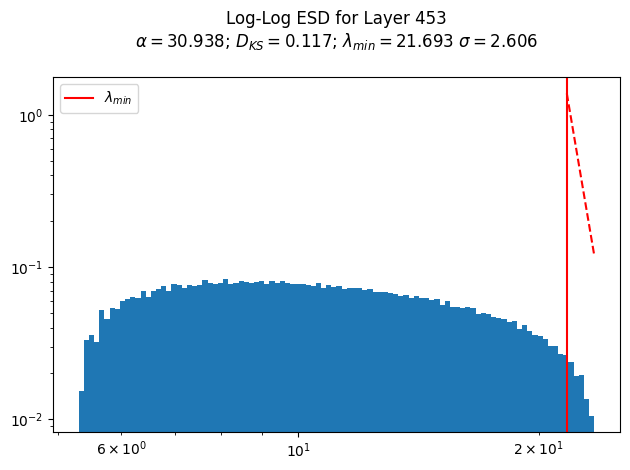

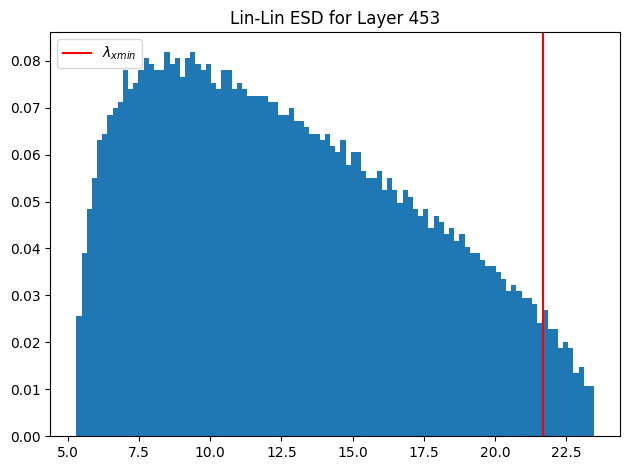

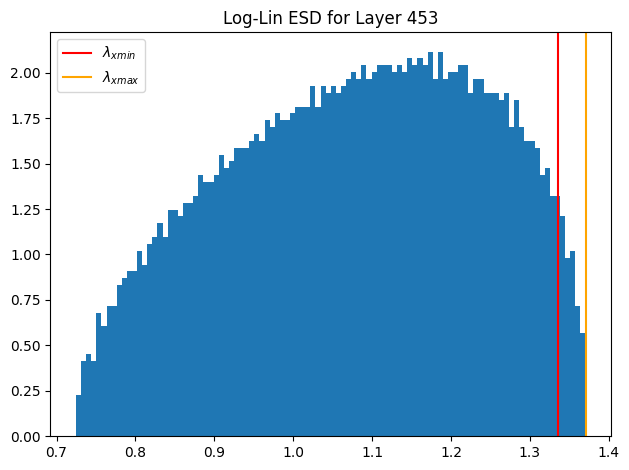

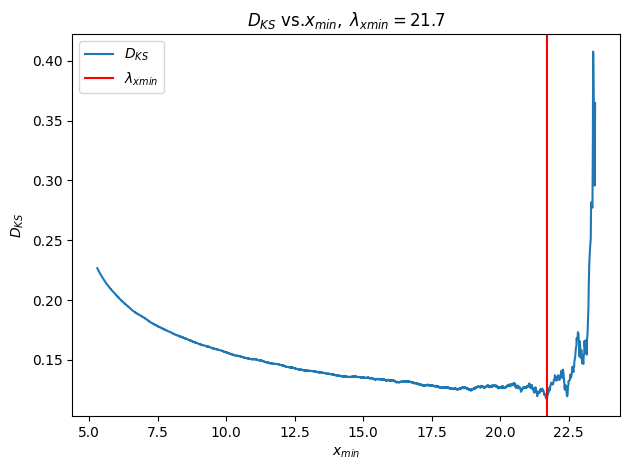

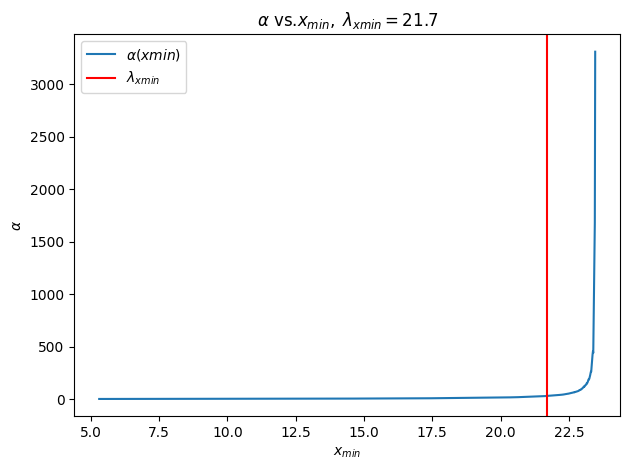

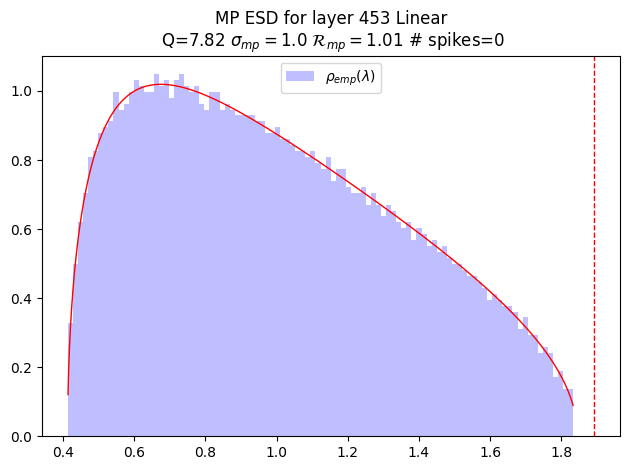

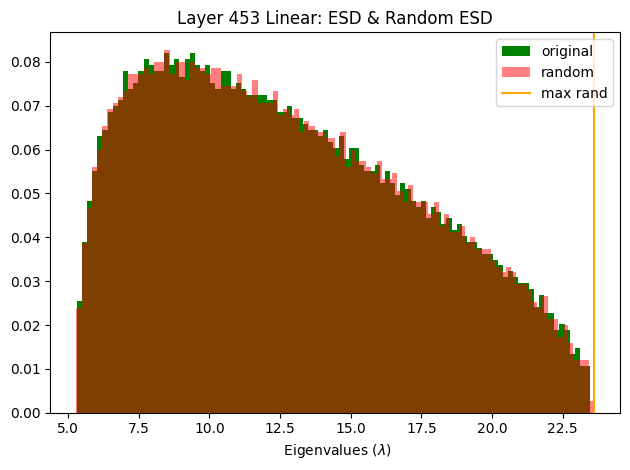

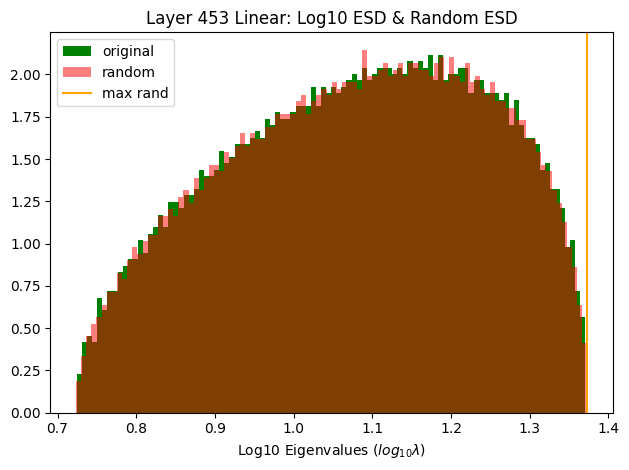

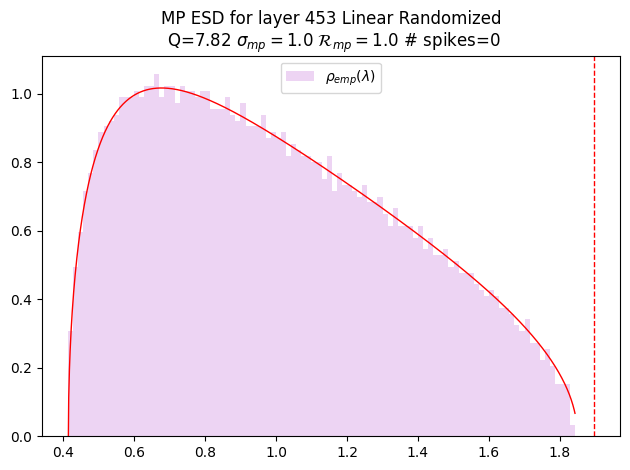

,layer_id,name,D,M,N,Q,W_scale,alpha,alpha_weighted,bulk_max,...,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,ww_maxdist,ww_softrank,xmax,xmin
0,453,Linear,0.117315,4096,32016,7.816406,0.279433,30.937844,42.405287,23.634146,...,2234.317964,success,4.845408,2.303124,under-trained,0,-0.139277,1.005932,23.477978,21.692974


<Figure size 640x480 with 0 Axes>

In [ ]:
details =  watcher.analyze(model=model, layers=[453], plot=True, randomize=True, mp_fit=True)
details

The graph and data reveal that most eigenvalues are clustered towards the lower end with a few showing higher importance. Training was halted optimally, but the model remains insufficiently fine-tuned. Comparing original eigenvalues to random values does not shows significant difference, reducing potential bias in the final layer. The layer appears stable, but indications of over-parameterization suggest potential overfitting. A crucial observation is the model's under-training, explaining the missing average line in the Log-Log ESD. In conclusion, while the current model may not yield significant improvements, further training may lead to notable changes in performance. More research must be done.

## Left as Suplimentary Exerciese for the Reader

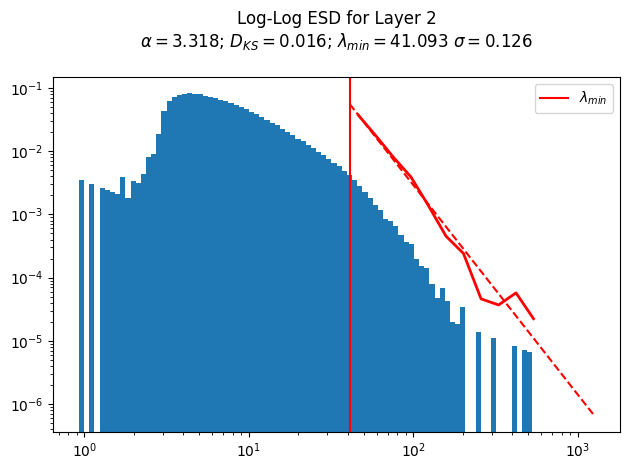

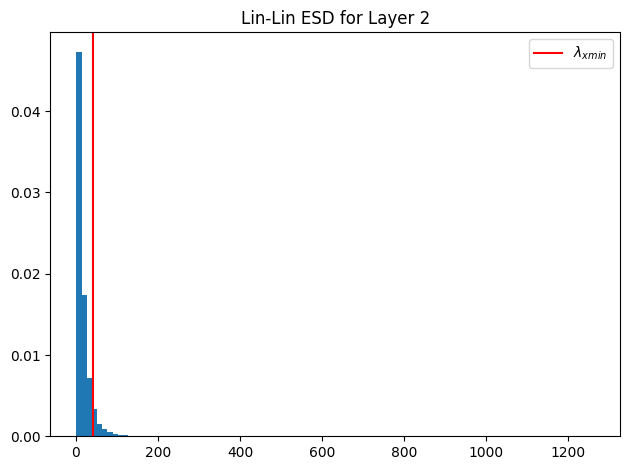

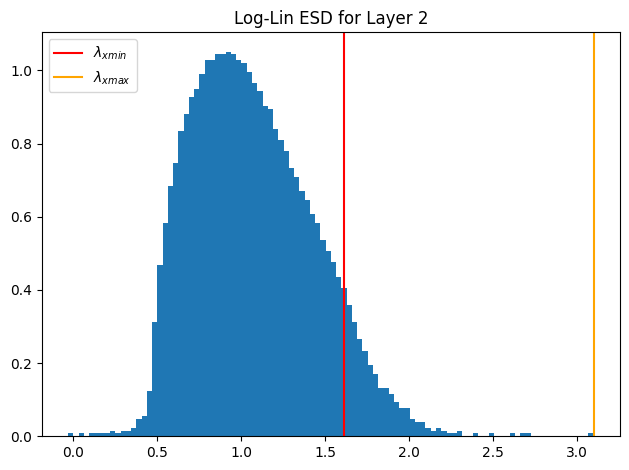

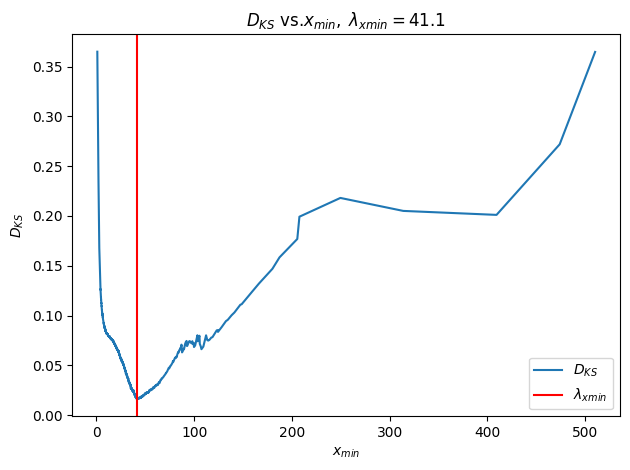

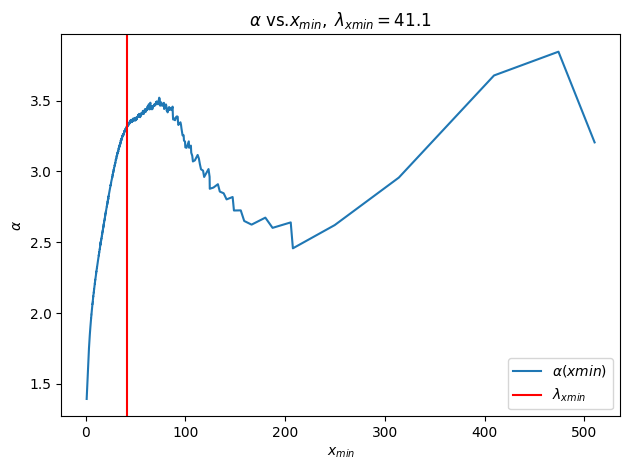

...

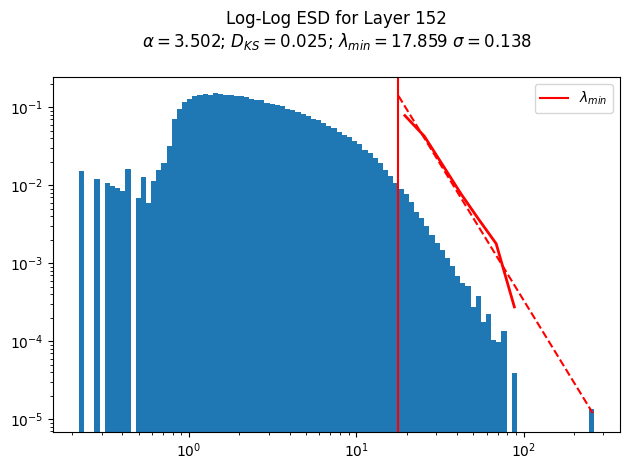

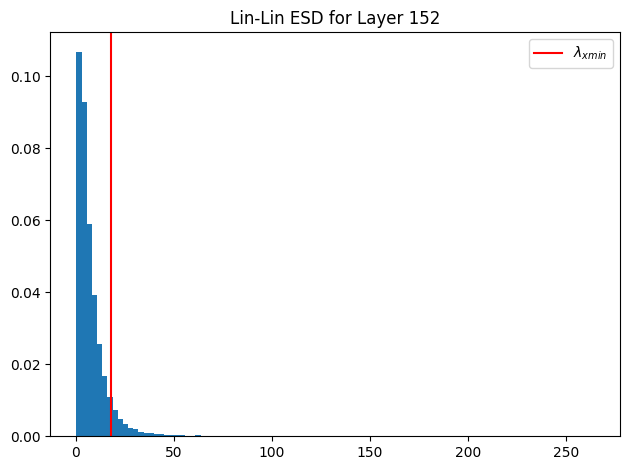

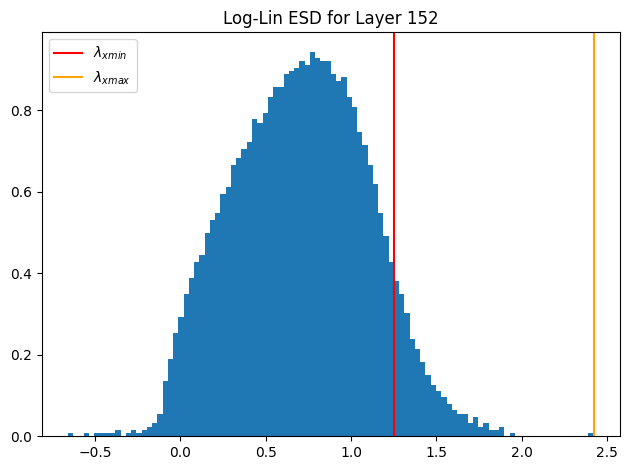

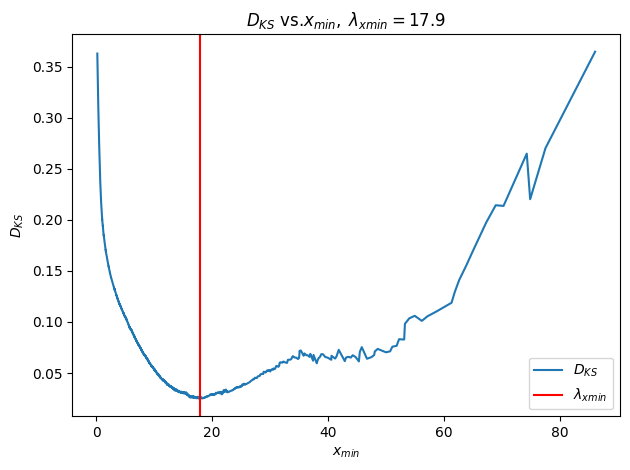

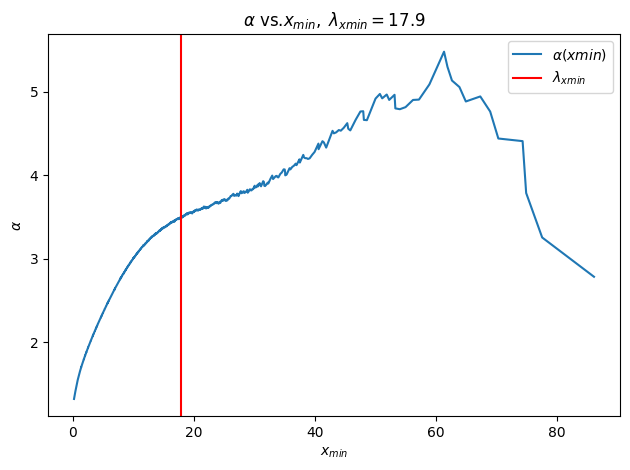

KeyboardInterrupt: ignored

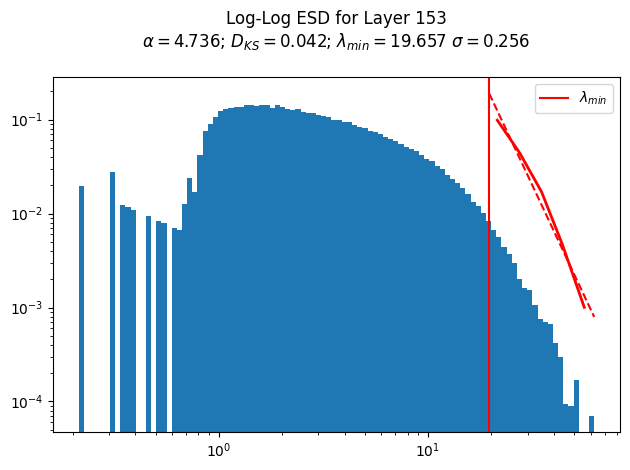

In [ ]:
details = watcher.analyze(plot=True)

In [6]:
#!pip install gradio

In [ ]:
model = AutoModelForCausalLM.from_pretrained("SweatyCrayfish/Linux-CodeLlama2")

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

# Merge Weights & Deploy

In [2]:
#!pip install transformers

In [3]:
#!pip install peft
#!pip install trl


In [ ]:

from huggingface_hub import notebook_login
notebook_login()

from datasets import load_dataset
import torch
from transformers import AutoModelForCausalLM, BitsAndBytesConfig, AutoTokenizer, TrainingArguments
from peft import LoraConfig
from trl import SFTTrainer

In [ ]:
BASE_MODEL = "codellama/CodeLlama-7b-hf"
ADAPTER_WEIGHTS = "/content/Model"  # Replace this with the path to your fine-tuned adapter model

In [ ]:
# Load base model
base_model = AutoModelForCausalLM.from_pretrained(BASE_MODEL)
tokenizer = AutoTokenizer.from_pretrained(BASE_MODEL)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|
    
    A token is already saved on your machine. Run `huggingface-cli whoami` to get more information or `huggingface-cli logout` if you want to log out.
    Setting a new token will erase the existing one.
    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Token: 
Add token as git credential? (Y/n) y
Token is valid (permission: write).
Your token has been saved in your

In [ ]:
from transformers import AutoModel

model = AutoModel.from_pretrained("SweatyCrayfish/Linux-CodeLlama2")

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
model.save_pretrained('SweatyCrayfish/Linux-CodeLlama2', push_to_hub=True, repo_name="Linux-CodeLlama2"),

In [ ]:
model.push_to_hub("SweatyCrayfish/Linux-CodeLlama2")

pytorch_model-00002-of-00003.bin:   0%|          | 0.00/9.89G [00:00<?, ?B/s]

pytorch_model-00001-of-00003.bin:   0%|          | 0.00/9.88G [00:00<?, ?B/s]

pytorch_model-00003-of-00003.bin:   0%|          | 0.00/6.66G [00:00<?, ?B/s]

Upload 3 LFS files:   0%|          | 0/3 [00:00<?, ?it/s]

(CommitInfo(commit_url='https://huggingface.co/SweatyCrayfish/Linux-CodeLlama2/commit/f20cb991570dd1ec2b2dec2260ae77a80d732955', commit_message='Upload model', commit_description='', oid='f20cb991570dd1ec2b2dec2260ae77a80d732955', pr_url=None, pr_revision=None, pr_num=None),)

In [ ]:
from transformers import AutoModelForCausalLM, BitsAndBytesConfig, AutoTokenizer, TrainingArguments
tokenizer = AutoTokenizer.from_pretrained("codellama/CodeLlama-7b-hf")

# Push the tokenizer to the Hugging Face hub
tokenizer.push_to_hub("Linux-CodeLlama2")

Using pad_token, but it is not set yet.
Using pad_token, but it is not set yet.


CommitInfo(commit_url='https://huggingface.co/SweatyCrayfish/Linux-CodeLlama2/commit/138f9cc7d410dca79d2ba13ceed9fd1f3b1e35d8', commit_message='Upload tokenizer', commit_description='', oid='138f9cc7d410dca79d2ba13ceed9fd1f3b1e35d8', pr_url=None, pr_revision=None, pr_num=None)

In [ ]:
from transformers import AutoModel

model = AutoModel.from_pretrained('SweatyCrayfish/Linux-CodeLlama2', from_tf=True),

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from transformers import AutoModel

In [4]:
#!pip install transformers

In [5]:
#!pip install weightwatcher

# Download the model to ensure that model was uploaded

In [ ]:
import weightwatcher as ww
import torchvision.models as models
from transformers import AutoModel, AutoModelForCausalLM, AutoTokenizer, TrainingArguments

model = AutoModelForCausalLM.from_pretrained("SweatyCrayfish/Linux-CodeLlama2")
watcher = ww.WeightWatcher(model=model)

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Some weights of LlamaForCausalLM were not initialized from the model checkpoint at SweatyCrayfish/Linux-CodeLlama2 and are newly initialized: ['lm_head.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
